###Dataset

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Dataset .csv to Dataset  (3).csv


In [ ]:
jp = pd.read_csv ("Dataset .csv")
jp.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
jp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [ ]:
jp.shape

(9551, 21)

### Level 1 - Task 1

Handling Missing Values

In [ ]:
missing_values = jp.isnull().sum()
print(missing_values)

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [ ]:
jp['Cuisines'].fillna('Unknown', inplace=True)

In [ ]:
jp.dropna(inplace=True)

In [ ]:
missing_values_after_fill = jp.isnull().sum()

In [ ]:
print("Missing values after handling:")
print(missing_values_after_fill)

Missing values after handling:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


Data Type Conversion

In [ ]:
categorical_columns = [
    "Has Table booking", "Has Online delivery",
    "Is delivering now", "Switch to order menu",
    "Rating color", "Rating text"
]

for column in categorical_columns:
    jp[column] = jp[column].astype('category')

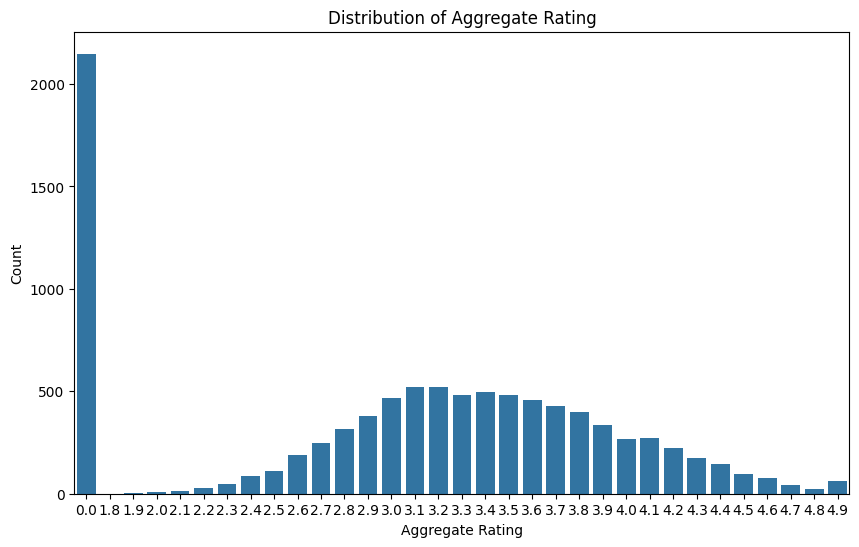

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(x='Aggregate rating', data=jp)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.show()

In [ ]:
data_types = jp.dtypes
data_types

Restaurant ID              int64
Restaurant Name           object
Country Code               int64
City                      object
Address                   object
Locality                  object
Locality Verbose          object
Longitude                float64
Latitude                 float64
Cuisines                  object
Average Cost for two       int64
Currency                  object
Has Table booking       category
Has Online delivery     category
Is delivering now       category
Switch to order menu    category
Price range                int64
Aggregate rating         float64
Rating color            category
Rating text             category
Votes                      int64
dtype: object

### Level 1 - Task 2

Step 1

In [ ]:
stats_measures = jp.describe()
print(stats_measures)

       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000  
25%              250.000000     1.000000        

Step 2

In [ ]:
country_code_distribution = jp['Country Code'].value_counts()
print(country_code_distribution)

Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


In [ ]:
city_distribution = jp['City'].value_counts()
print(city_distribution)

City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64


In [ ]:
cuisines_distribution = jp['Cuisines'].value_counts()
print(cuisines_distribution)

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1826, dtype: int64


Step 3

In [ ]:
top_cuisines = jp['Cuisines'].value_counts().head(10)
print(top_cuisines)

Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [ ]:
top_cities = jp['City'].value_counts().head(10)
print(top_cities)

City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


Visualization

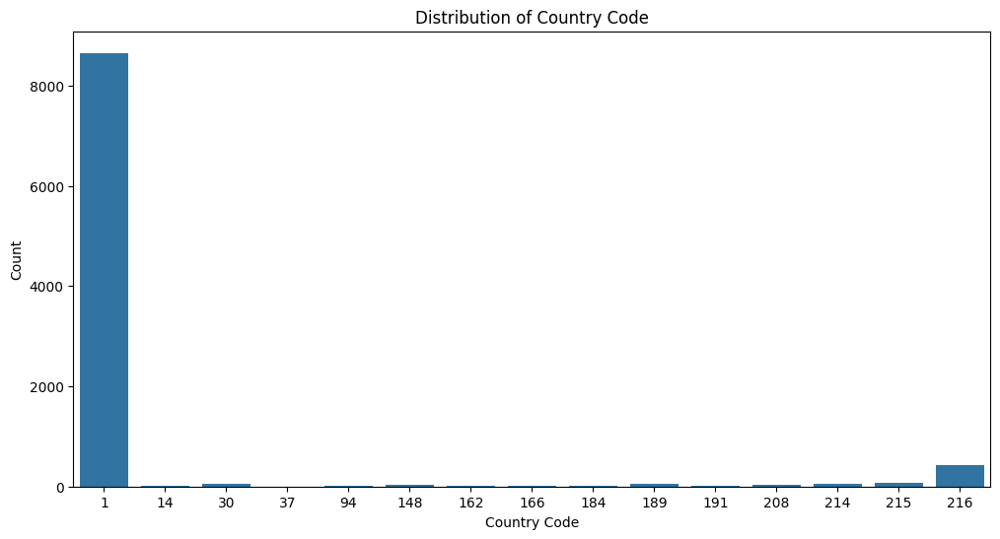

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.countplot(x='Country Code', data=jp)
plt.title('Distribution of Country Code')
plt.xlabel('Country Code')
plt.ylabel('Count')
plt.show()

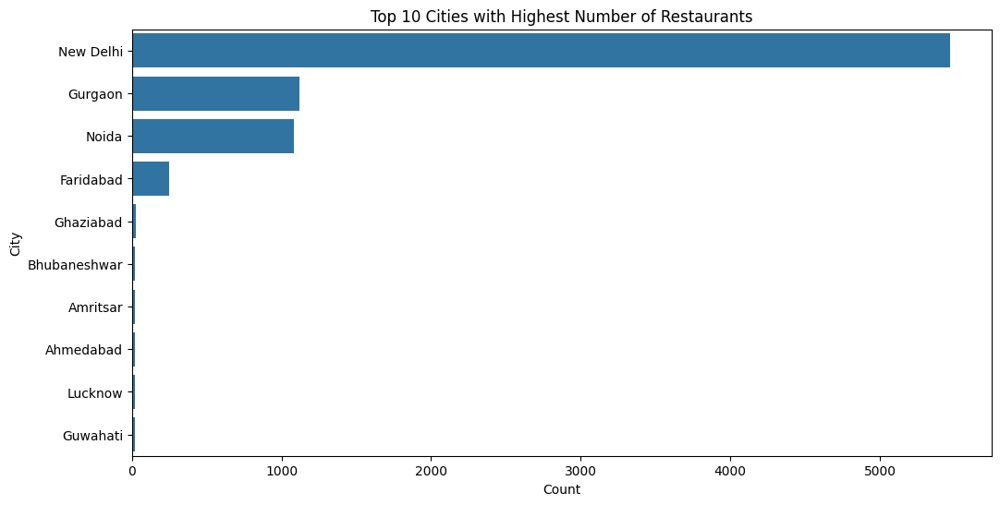

In [ ]:
plt.figure(figsize=(12, 6))
top_cities_plot = jp['City'].value_counts().head(10).index
sns.countplot(y='City', data=jp, order=top_cities_plot)

plt.title('Top 10 Cities with Highest Number of Restaurants')
plt.xlabel('Count')
plt.ylabel('City')
plt.show()

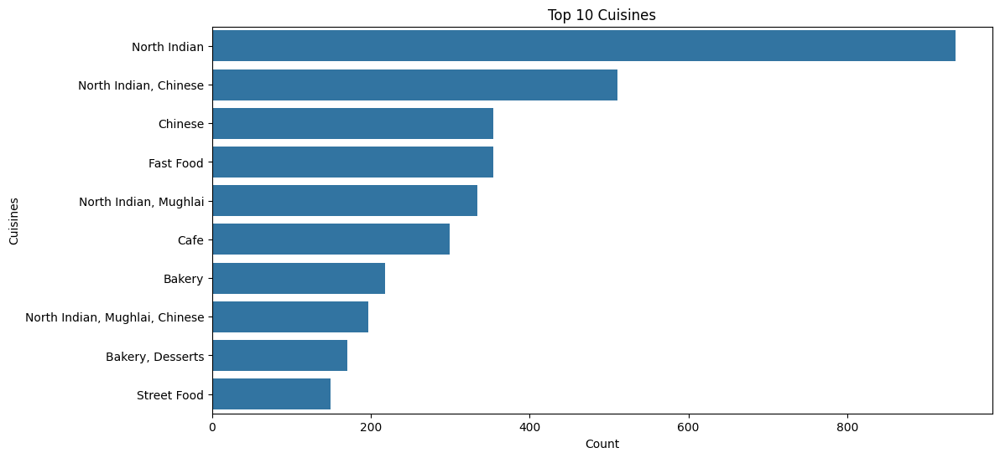

In [ ]:
plt.figure(figsize=(12, 6))
top_cuisines_plot = jp['Cuisines'].value_counts().head(10).index
sns.countplot(y='Cuisines', data=jp, order=top_cuisines_plot)

plt.title('Top 10 Cuisines')
plt.xlabel('Count')
plt.ylabel('Cuisines')
plt.show()

### Level 1 - Task 3

Geospatial Analysis

Step 1

In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

In [ ]:
map_center = [jp['Latitude'].mean(), jp['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=15)

In [ ]:
marker_cluster = MarkerCluster().add_to(restaurant_map)

In [ ]:
for idx, row in jp.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']],
                  popup=row['Restaurant Name']).add_to(marker_cluster)


In [ ]:
restaurant_map.save('restaurant_map.html')
restaurant_map

Step 2

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

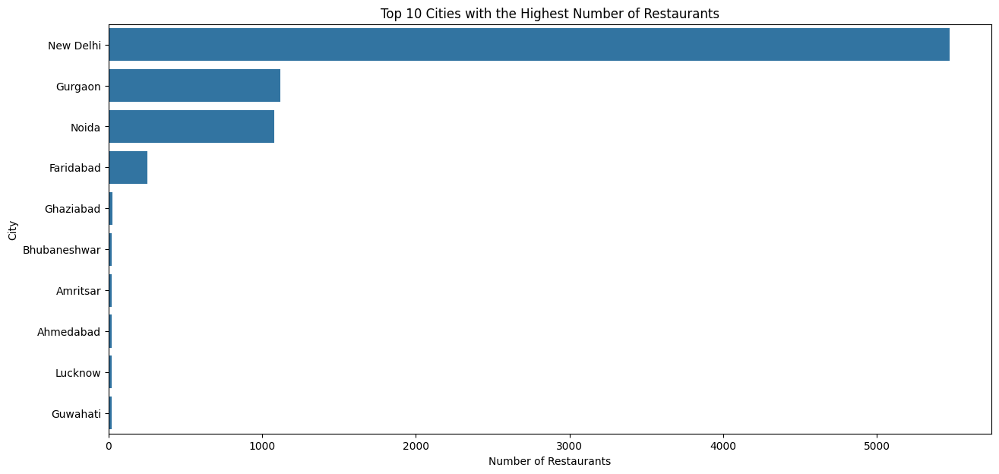

In [ ]:
plt.figure(figsize=(15, 7))
top_cities = jp['City'].value_counts().head(10).index
sns.countplot(y='City', data=jp, order=top_cities)
plt.title('Top 10 Cities with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

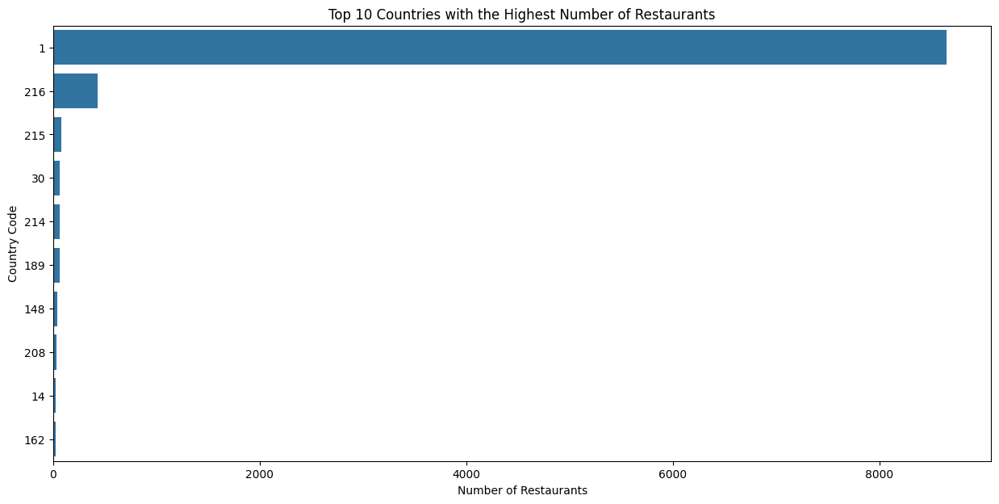

In [ ]:
plt.figure(figsize=(15, 7))
top_countries = jp['Country Code'].value_counts().head(10).index
sns.countplot(y='Country Code', data=jp, order=top_countries)
plt.title('Top 10 Countries with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country Code')
plt.show()

Step 3

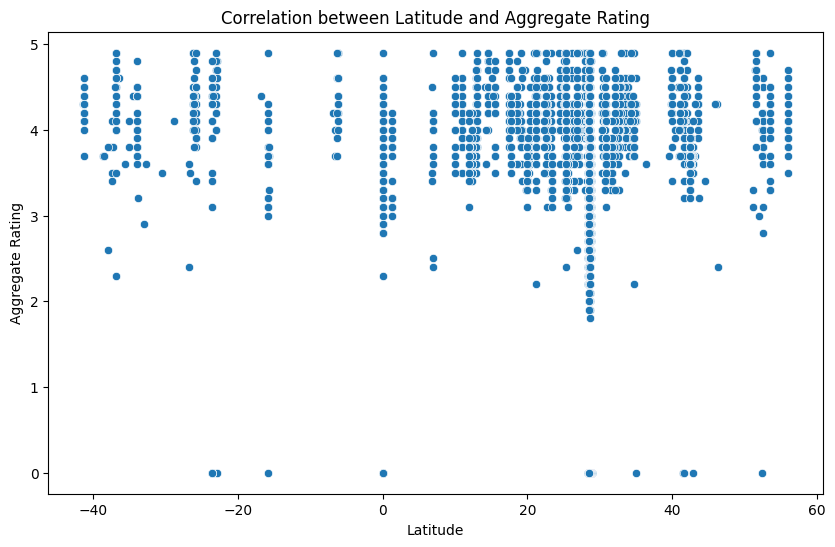

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Latitude', y='Aggregate rating', data=jp)
plt.title('Correlation between Latitude and Aggregate Rating')
plt.xlabel('Latitude')
plt.ylabel('Aggregate Rating')
plt.show()

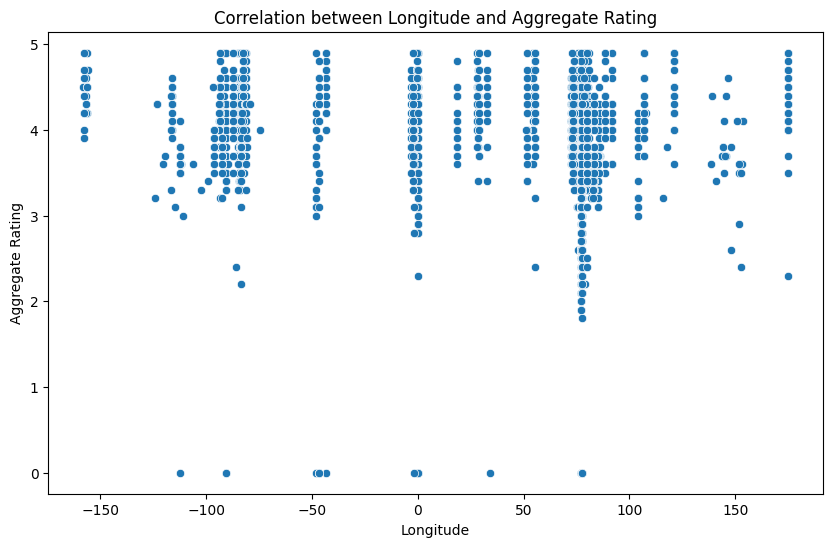

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Aggregate rating', data=jp)
plt.title('Correlation between Longitude and Aggregate Rating')
plt.xlabel('Longitude')
plt.ylabel('Aggregate Rating')
plt.show()

In [ ]:
latitude_corr = jp['Latitude'].corr(jp['Aggregate rating'])
longitude_corr = jp['Longitude'].corr(jp['Aggregate rating'])

print(f"Correlation between Latitude and Aggregate Rating: {latitude_corr}")
print(f"Correlation between Longitude and Aggregate Rating: {longitude_corr}")

Correlation between Latitude and Aggregate Rating: 0.0005155806902359908
Correlation between Longitude and Aggregate Rating: -0.11681757734540431
